# 08wk-2: 이미지분석 (3)

최규빈  
2022-10-25

> Transfer Learninig (CIFAR10/ResNet18), CAM의 구현 및 시각화

# 강의영상

> <https://youtube.com/playlist?list=PLQqh36zP38-xkHPJ1DiPKfseoBl9yUY4P>

# imports

In [1]:
import torch 
import torchvision
from fastai.vision.all import * 

# Transfer Learning

In [2]:
path = untar_data(URLs.CIFAR)

In [3]:
path.ls()

## 수제네트워크

`(1)` dls

In [68]:
dls = ImageDataLoaders.from_folder(path,train='train',valid='test') 

In [75]:
_X,_y = dls.one_batch()
_X.shape, _y.shape

In [77]:
!ls /home/cgb4/.fastai/data/cifar10/train # 10개의 클래스

airplane  automobile  bird  cat  deer  dog  frog  horse  ship  truck

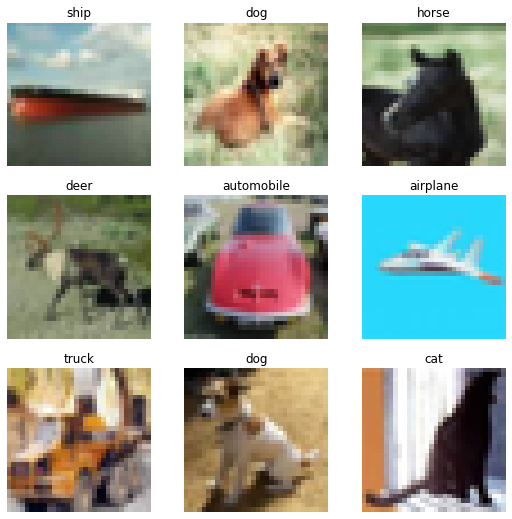

In [78]:
dls.show_batch()

`(2)` lrnr 생성

In [82]:
net1 = torch.nn.Sequential(
    torch.nn.Conv2d(3,128,(5,5)),
    torch.nn.ReLU(),
    torch.nn.MaxPool2d((2,2)),
    torch.nn.Flatten()
)

In [88]:
net1(_X.to("cpu")).shape

In [94]:
net = torch.nn.Sequential(
    net1, 
    torch.nn.Linear(25088,10)
)
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy) 

`(3)` 학습

In [95]:
lrnr.fit(10)

-   이게 생각보다 잘 안맞아요.. 70넘기 힘듬

## 전이학습 (남이 만든 네트워크)

`(2)` lrnr 생성

In [109]:
net = torchvision.models.resnet18(weights=torchvision.models.resnet.ResNet18_Weights.IMAGENET1K_V1)
net

-   $k=1000$ 즉 1000개의 물체를 구분하는 모형임

In [116]:
net.fc = torch.nn.Linear(in_features=512, out_features=10) 

In [117]:
loss_fn = torch.nn.CrossEntropyLoss() 
lrnr = Learner(dls,net,loss_fn,metrics=accuracy)

`(3)` 학습

In [118]:
lrnr.fit(10) 

-   CIFAR10을 맞추기 위한 네트워크가 아님에도 불구하고 상당히 잘맞음
-   일반인이 거의 밑바닥에서 설계하는것보다 전이학습을 이용하는 것이
    효율적일 경우가 많다.

## 전이학습 다른 구현: 순수 fastai 이용

`-` 예전코드 복습

In [130]:
path = untar_data(URLs.PETS)/'images'

In [120]:
files= get_image_files(path)

In [121]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [122]:
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

In [133]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

In [127]:
lrnr.fine_tune(1)

`-` 사실 위의 코드가 transfer learning 이었음.

In [134]:
#collapse_output
lrnr.model

# CAM

## CAM이란?

-   ref:
    <http://cnnlocalization.csail.mit.edu/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf>

`-` Class Activation Mapping (CAM)은 설명가능한 인공지능모형
(eXplainable Artificial Intelligence, XAI) 중 하나로 CNN의 판단근거를
시각화하는 기술

## 학습에 사용할 데이터 Load

In [4]:
path = untar_data(URLs.PETS)/'images'

In [5]:
path.ls()

In [6]:
files= get_image_files(path)
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'
dls = ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

## 구현0단계– 예비학습

### `#` 하나의 이미지 선택

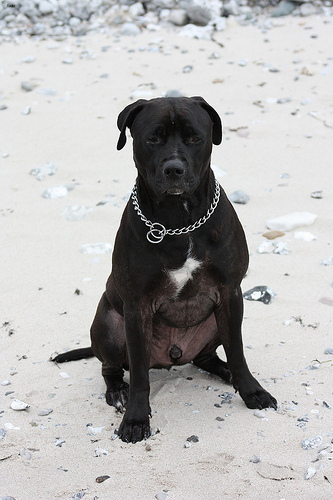

In [7]:
ximg = PILImage.create('/home/cgb4/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
ximg

In [8]:
x = first(dls.test_dl([ximg]))[0]
x

In [10]:
import fastai

In [11]:
fastai.__version__

### `#` AP layer

In [125]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1) 

In [126]:
X = torch.arange(48).reshape(1,3,4,4)*1.0 
X

In [127]:
ap(X)

In [128]:
X[0,0,...].mean(),X[0,1,...].mean(),X[0,2,...].mean()

### `#` torch.einsum

(예시1)

In [129]:
tsr = torch.arange(12).reshape(4,3)
tsr

In [130]:
torch.einsum('ij->ji',tsr)

(예시2)

In [131]:
tsr1 = torch.arange(12).reshape(4,3).float()
tsr2 = torch.arange(15).reshape(3,5).float()

In [132]:
tsr1 @ tsr2

In [133]:
torch.einsum('ij,jk -> ik',tsr1,tsr2) 

(예시3)

In [134]:
x.to("cpu").shape

In [135]:
torch.einsum('ocij -> ijc',x.to("cpu")).shape

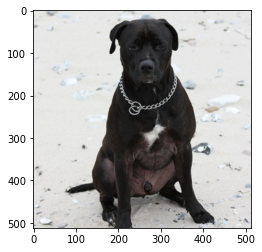

In [136]:
plt.imshow(torch.einsum('ocij -> ijc',x.to("cpu")))

## 구현1단계– 이미지분류 잘하는 네트워크 선택

In [137]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

/home/cgb4/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/home/cgb4/anaconda3/envs/py37/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)

In [138]:
lrnr.fine_tune(1)

## 구현2단계– 네트워크의 끝 부분 수정

`-` 모형의 분해

In [139]:
net1= lrnr.model[0]
net2= lrnr.model[1]

`-` net2를 좀더 살펴보자.

In [140]:
net2

In [141]:
_X, _y = dls.one_batch() 

In [142]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [143]:
print(net1(_X).shape)
print(net2[0](net1(_X)).shape)
print(net2[1](net2[0](net1(_X))).shape)
print(net2[2](net2[1](net2[0](net1(_X)))).shape)

torch.Size([64, 512, 16, 16])
torch.Size([64, 1024, 1, 1])
torch.Size([64, 1024])
torch.Size([64, 1024])

`-` net2를 아래와 같이 수정하고 재학습하자 (왜?)

In [144]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # (64,512,16,16) -> (64,512,1,1) 
    torch.nn.Flatten(), # (64,512,1,1) -> (64,512) 
    torch.nn.Linear(512,2,bias=False) # (64,512) -> (64,2) 
)

In [147]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [148]:
lrnr2= Learner(dls,net,metrics=accuracy) # loss_fn??

In [149]:
lrnr2.loss_func, lrnr.loss_func ## 알아서 기존의 loss function으로 잘 들어가 있음. 

In [150]:
lrnr2.fine_tune(5) # net2를 수정해서 accuracy가 안좋아지긴 했는데 그래도 쓸만함 

## 구현3단계– 수정된 net2에서 Linear와 AP의 순서를 바꿈

`-` 1개의 observation을 고정하였을 경우 출력과정 상상

In [153]:
ximg = PILImage.create('/home/cgb4/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_106.jpg')
x = first(dls.test_dl([ximg]))[0]

In [155]:
net2

In [99]:
print(net1(x).shape)
print(net2[0](net1(x)).shape)
print(net2[1](net2[0](net1(x))).shape)
print(net2[2](net2[1](net2[0](net1(x)))).shape)

torch.Size([1, 512, 16, 16])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 2])

`-` 최종결과 확인

In [156]:
net(x)

In [158]:
dls.vocab

-   net(x)에서 뒤쪽의 값이 클수록 ’dog’를 의미한다.

`-` net2의 순서 바꾸기 전 전체 네트워크:

$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [-9.0358,  9.0926]$$

`-` 아래와 같이 순서를 바꿔서 한번 계산해보고 싶다. (왜???..)

$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [−9.0358,9.0926]$$

-   여기에서 (1,512,16,16) -\> (1,2,16,16) 로 가는 선형변환을 적용하는
    방법? **(16,16) each pixel에 대하여 (512 $\to$ 2)로 가는 변환을
    수행**

`-` 통찰: 이 경우 특이하게도 레이어의 순서를 바꿨을때 출력이 동일함
(선형변환하고 평균내거나 평균내고 선형변환하는건 같으니까)

In [160]:
_x =torch.tensor([1,2,3.14,4]).reshape(4,1)
_x 

In [168]:
_l1 = torch.nn.Linear(1,1,bias=False)
_l1(_x).mean() # _x -> 선형변환 -> 평균 

In [169]:
_l1(_x.mean().reshape(1,1)) # _x -> 평균 -> 선형변환

`-` 구현해보자.

In [181]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))

In [185]:
net2[0](why)

In [186]:
net(x)

## 잠깐 멈추고 생각

`-` 이미지

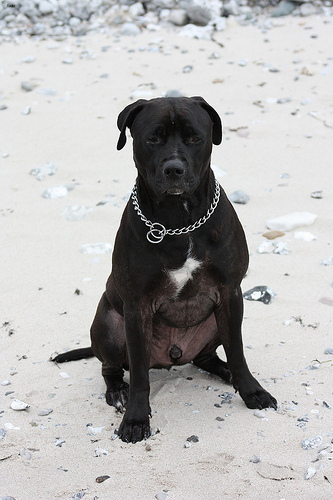

In [187]:
ximg

`-` 네트워크의 결과

In [191]:
net2(net1(x))

-   -9.0358 \<\< 9.0926 이므로 ’ximg’는 높은 확률로 개라는 뜻이다.

`-` 아래의네트워크를 관찰

$$\underset{(1,2,16,16)}{{\bf why}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [-9.0358,9.0926]$$

In [196]:
net2[0](why)

더 파고들어서 분석해보자.

In [198]:
why.shape

In [204]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

***`why[0,0,:,:]`***

In [225]:
#collapse_output
(why[0,0,:,:]).to(torch.int64)

-   이 값들의 평균은 -9.0358 이다. (이 값이 클수록 이 그림이 고양이라는
    의미 = 이 값이 작을수록 이 그림이 고양이가 아니라는 의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 작은값이 있어서 -9.0358이라는 평균값이 나옴
    $\to$ 특정위치에 존재하는 엄청 작은 값들은 ximg가 고양이가 아니라고
    판단하는 근거가 된다.

***`why[0,1,:,:]`***

In [226]:
#collapse_output
(why[0,1,:,:]).to(torch.int64)

-   이 값들의 평균은 9.0926 이다. (이 값이 클수록 이 그림이 강아지라는
    의미)
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가짐. 다만
    특정위치에서 엄청 큰 값들이 있어서 9.0926이라는 평균값이 나옴 $\to$
    특정위치에 존재하는 엄청 큰 값들은 결국 ximg를 강아지라고 판단하는
    근거가 된다.

`-` 시각화

In [227]:
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

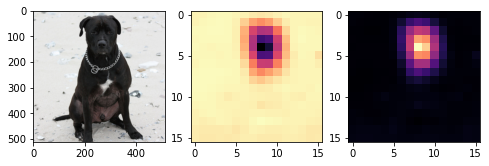

In [251]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma')

-   magma = 검은색 \< 보라색 \< 빨간색 \< 노란색
-   왼쪽그림의 검은 부분은 고양이가 아니라는 근거, 오른쪽그림의
    노란부분은 강아지라는 근거

`-` why_cat, why_dog를 (16,16) $\to$ (512,512) 로 resize

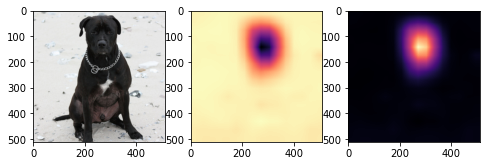

In [254]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

`-` 겹쳐그리기

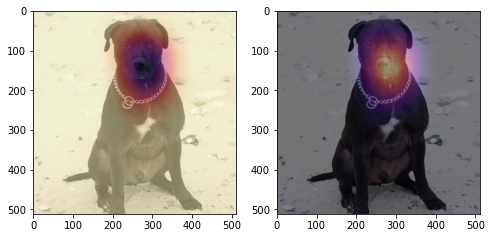

In [256]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화

In [263]:
#
#!wget https://github.com/guebin/DL2022/blob/master/_notebooks/2022-09-06-hani01.jpeg?raw=true
ximg= PILImage.create('2022-09-06-hani01.jpeg')
x= first(dls.test_dl([ximg]))[0]

In [264]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))
why_cat = why[0,0,:,:]
why_dog = why[0,1,:,:]

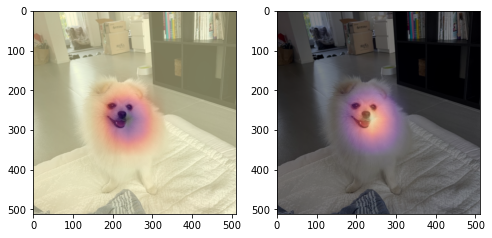

In [265]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

`-` 하니이미지 시각화 with prob

In [267]:
sftmax=torch.nn.Softmax(dim=1)

In [268]:
sftmax(net(x))

In [272]:
catprob, dogprob = sftmax(net(x))[0,0].item(), sftmax(net(x))[0,1].item()

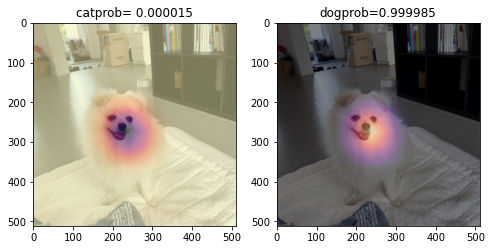

In [277]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_cat.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[0].set_title('catprob= %f' % catprob) 
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_dog.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].set_title('dogprob=%f' % dogprob)

## 구현4단계– CAM 시각화

In [278]:
sftmax = torch.nn.Softmax(dim=1)

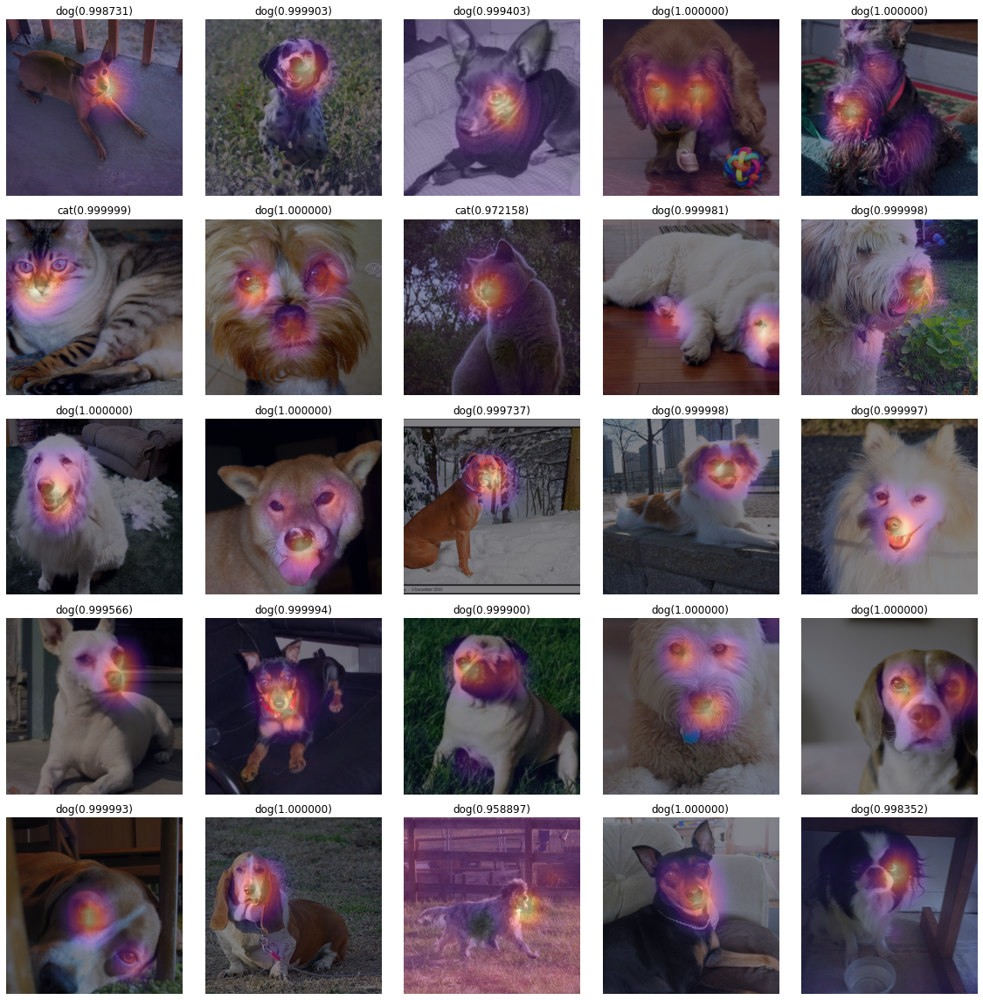

In [279]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

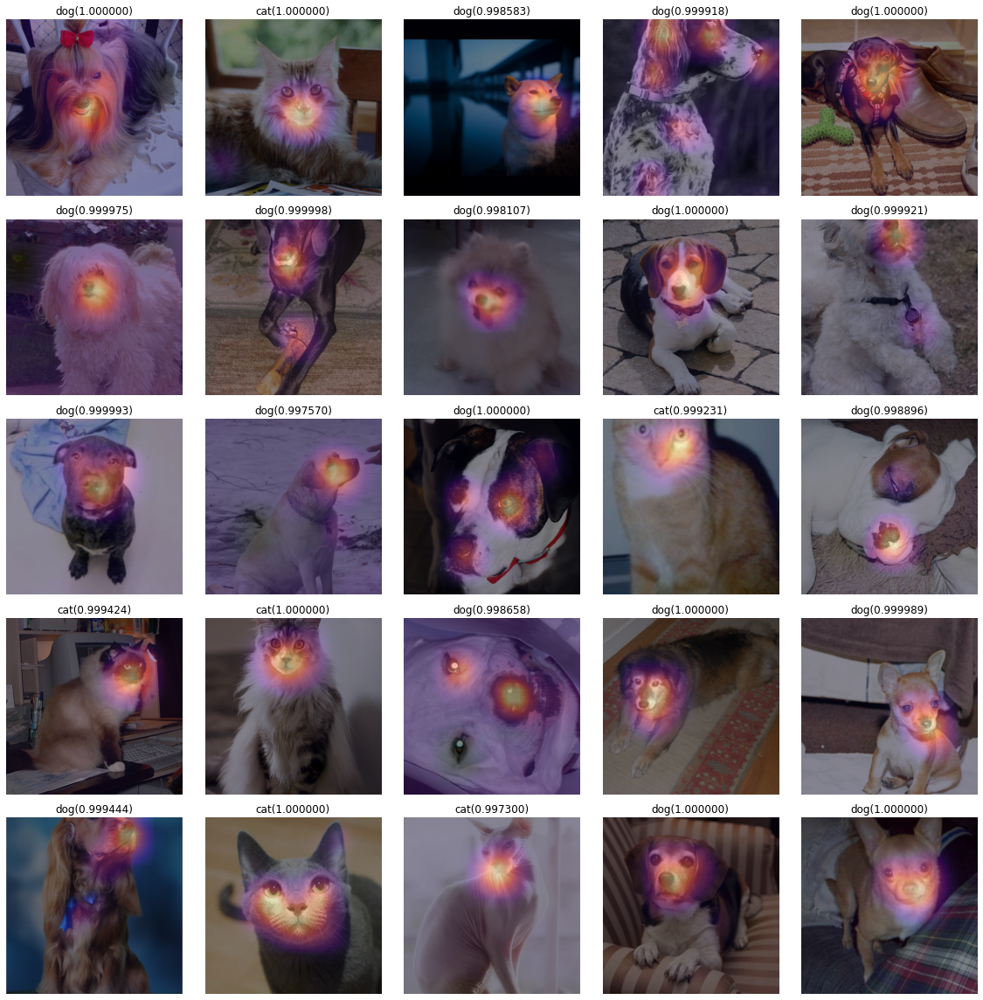

In [280]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

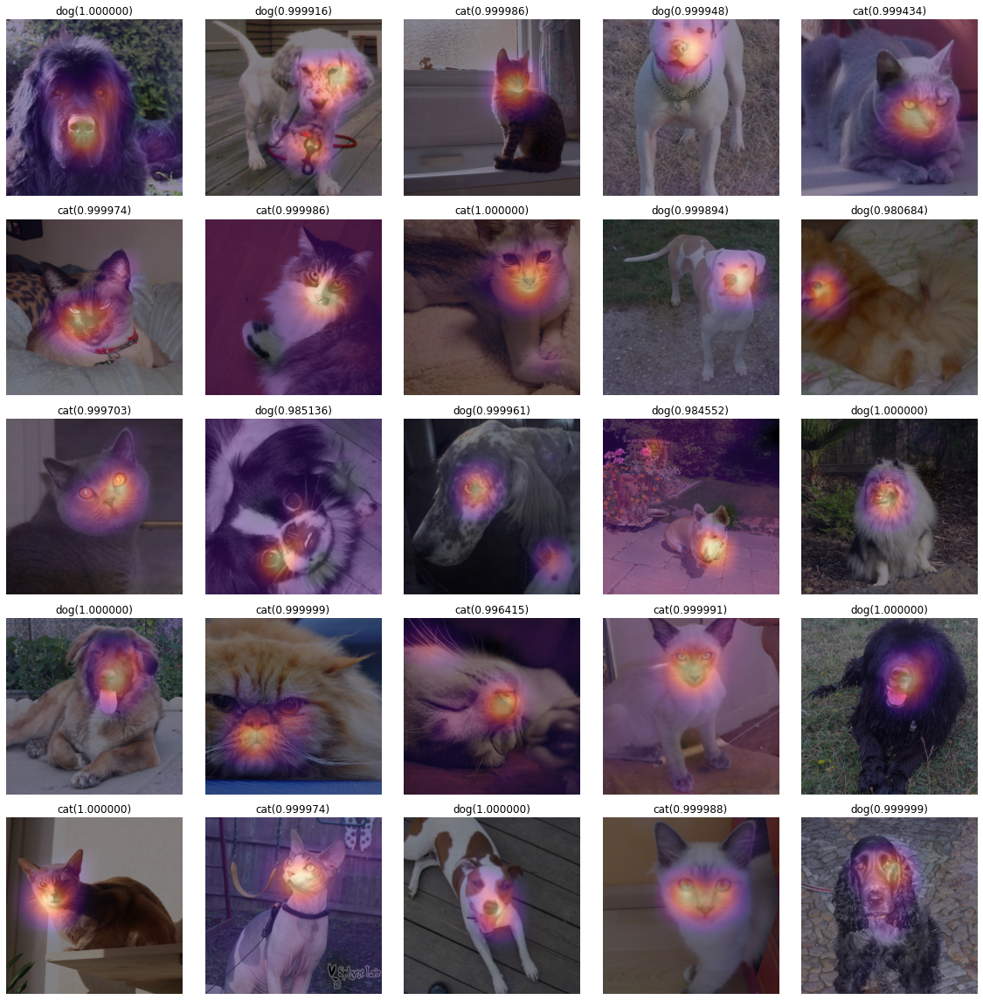

In [281]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

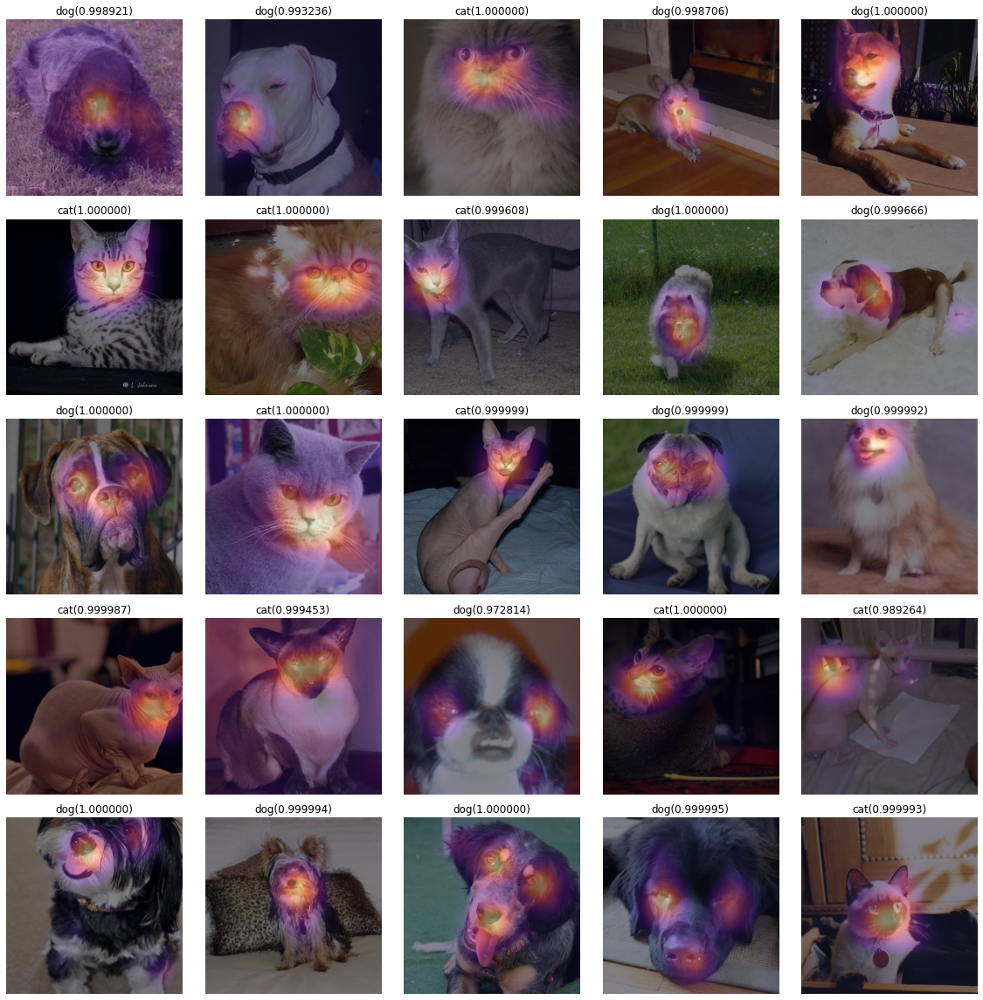

In [282]:
fig, ax = plt.subplots(5,5) 
k=75
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_cat = why[0,0,:,:] 
        why_dog = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_cat.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("cat(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_dog.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("dog(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()